# Microglia

The microglial compartment of the multiome is more complex than that of RNA only, suggesting ATAC data may be capturing activation states. A large number of clusters is very similar and challenging to distinguish based on gene expression markers, having a gradient variation only - these are clusters 0, 1 and 4, especially, which seem to be in a transition state in between homeostasis (cluster 3) and activation  (cluster 2). I have not re-merged these clusters should there be chromatin availability differences between the clusters which are not being captured at a gene expression level. 

 
 - Cluster 0 - Microglia_P2RY12pos_APBB1IPmed_1
 - Cluster 1 - Microglia_P2RY12pos_APBB1IPmed_2
 - Cluster 2 - Microglia_P2RY12pos_APBB1IPhi_RUNX1hi_ARHGAP24hi - up notch, modulation of microglial activation - activated microglia
 - Cluster 3 - Microglia_P2RY12neg_BCYRN1hi - Homeostatic (?) Microglia
 - Cluster 4 - Microglia_P2RY12pos_APBB1IPhi_RUNX1med - Immunorreactive (?) microglia - activated microglia
 - Cluster 5 - DendriticCells_CD83hi_ELL2
 - Cluster 6 - M2 Macrophages_F13A1pos_CD163pos_MRC1pos
 - Cluster 7 - Microglia_P2RY12pos - Injury Response Microglia
 - Cluster 8 - Tcells_CD96pos_CD247pos - T-cells
 - Cluster 9 - Microglia_CENPFpos_TOP2Apos_MKI67pos - Proliferating microglia
 - Cluster 10 - Microglia_SLC24A2hi_CTNNA3hi - Microglia - Synapse formation
 - Cluster 11 - Microglia_P2RY12pos_IL1Bpos_CCL3pos_IL1Apos - Microglia - IL response
 - Cluster 12 - Microglia_P2RY12pos_ENSG00000240040pos - Microglia

# 1.0 First checks

In [2]:
import muon as mu
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot

In [3]:
mudata = mu.read('Microglia_clustered.h5mu')


In [5]:
mudata['rna'].obsm['X_umap'] = mudata.obsm['X_umap']
mudata['rna'].obs['mm_leiden_res0.5'] = mudata.obs['leiden_res0.5']
mudata['rna'].obs['mm_leiden_res0.5']

index
AAACAGCCAAACCTAT-13    2
AAACAGCCAAATATCC-22    0
AAACAGCCAACCCTCC-17    9
AAACAGCCAAGGTCCT-13    2
AAACAGCCAATAGCCC-2     1
                      ..
TTTGTTGGTGTGCACG-17    0
TTTGTTGGTGTGCACG-52    1
TTTGTTGGTTAAGCGC-4     3
TTTGTTGGTTATCGAG-10    4
TTTGTTGGTTATTGCC-16    0
Name: mm_leiden_res0.5, Length: 23108, dtype: category
Categories (13, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']

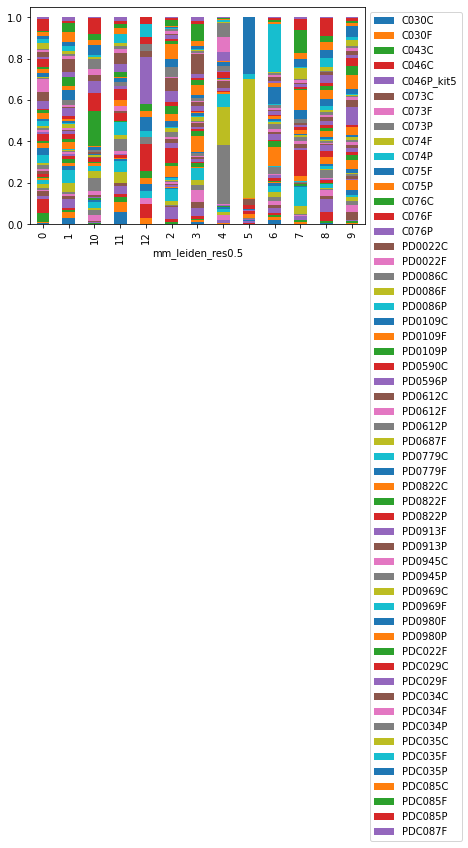

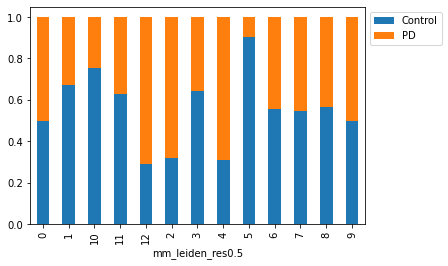

In [4]:
tmp = pd.crosstab(mudata['rna'].obs['mm_leiden_res0.5'],mudata['rna'].obs['sample_id'],normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.0, 1.0))

tmp = pd.crosstab(mudata['rna'].obs['mm_leiden_res0.5'],mudata['rna'].obs['Group'],normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.0, 1.0))

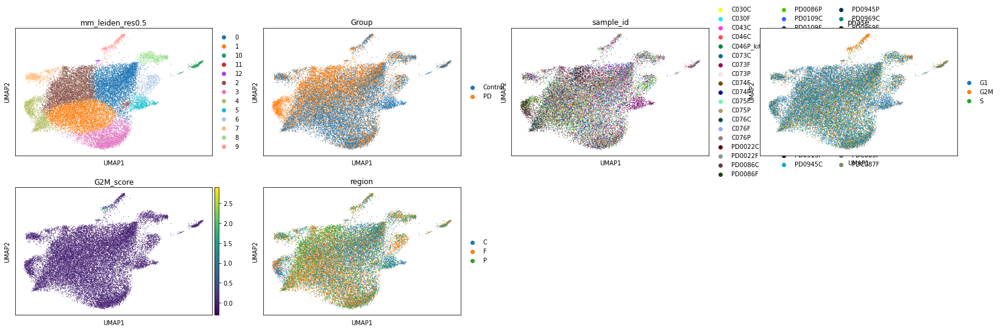

In [5]:
genes = ['mm_leiden_res0.5', 'Group', 'sample_id', 'phase', 'G2M_score', 'region']

sc.pl.umap(mudata['rna'], color = genes)

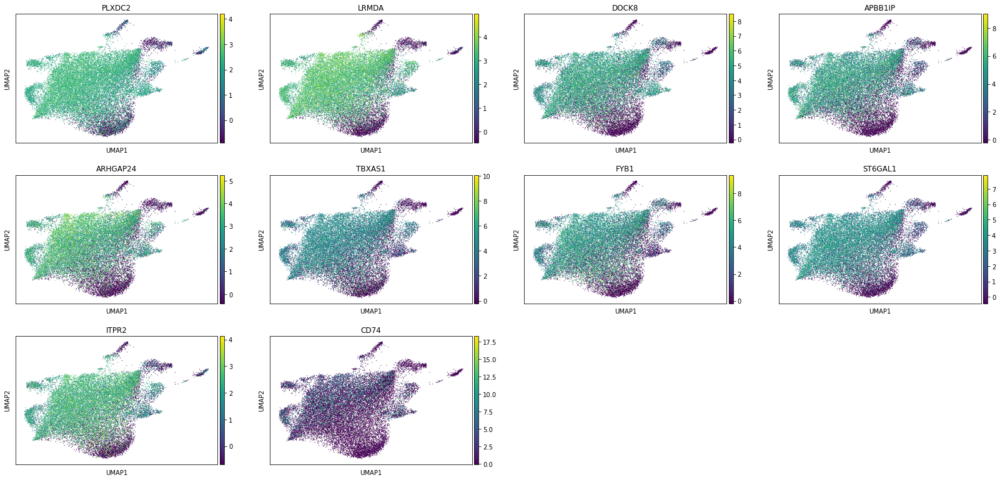

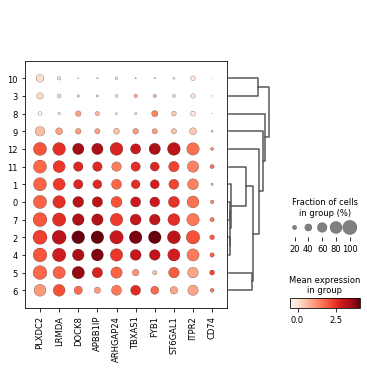

In [6]:
genes = [ 'PLXDC2','LRMDA','DOCK8','APBB1IP','ARHGAP24','TBXAS1','FYB1','ST6GAL1','ITPR2','CD74']
sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

# 2.0 Check markers

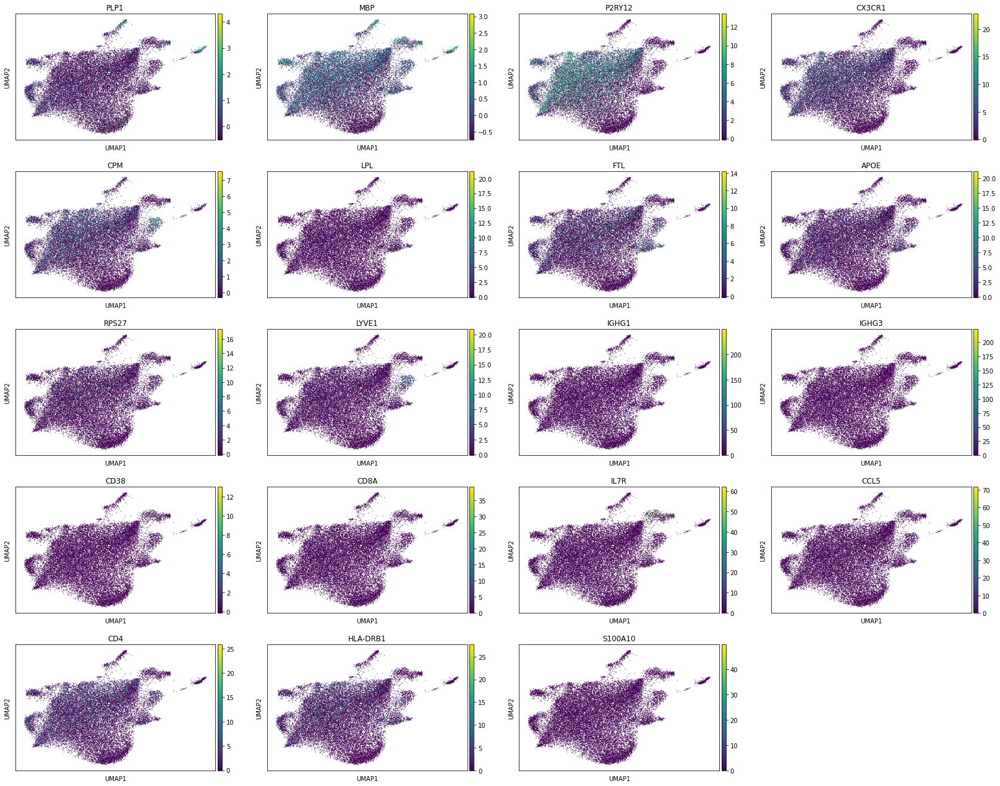

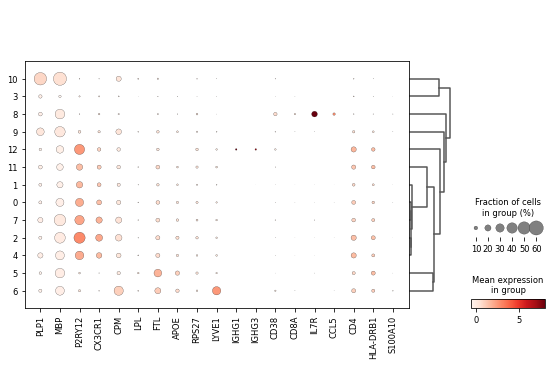

In [7]:
genes = [ 'PLP1', 'MBP', 'P2RY12', 'CX3CR1', 'CPM', 'LPL', 'FTL', 'APOE', 'RPS27', 'LYVE1', 'IGHG1', 'IGHG3', 'CD38', 'CD8A', 'IL7R', 'CCL5', 'CD4', 'HLA-DRB1', 'S100A10']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

# 3.0 Cluster characterisation (HVGs)

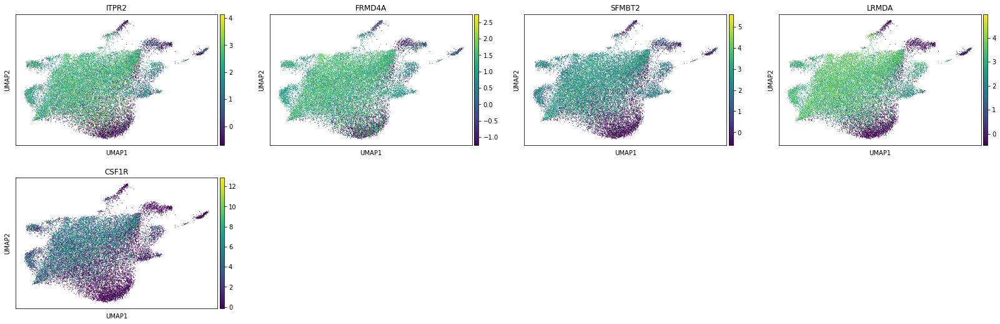

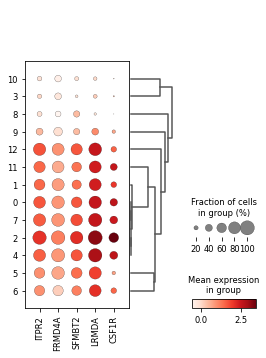

In [8]:
#CLUSTER 0 - Microglia - P2RY12pos_APBB1IPmed 1

genes = ['ITPR2', 'FRMD4A', 'SFMBT2', 'LRMDA', 'CSF1R']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

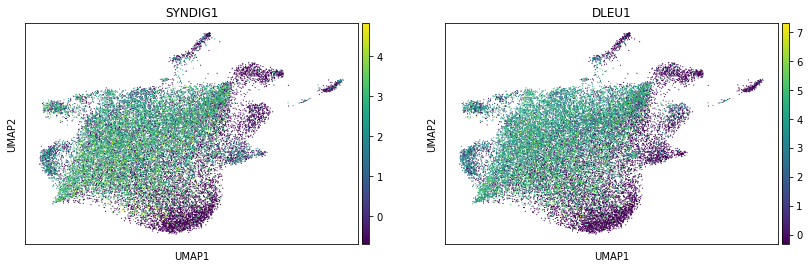

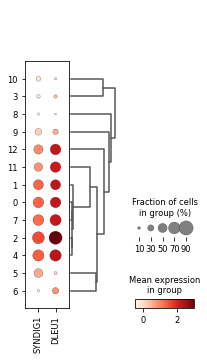

In [9]:
#CLUSTER 1 - P2RY12pos_APBB1IPmed 2

genes = ['SYNDIG1', 'DLEU1']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

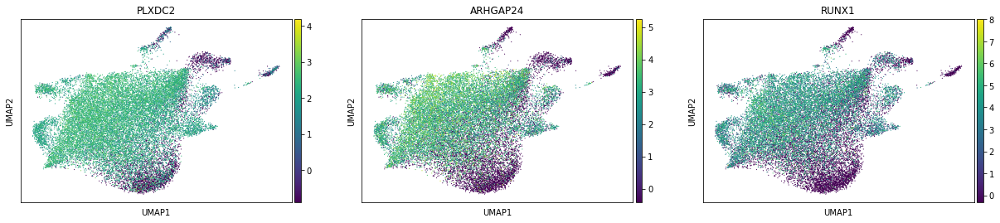

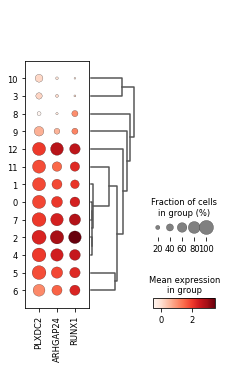

In [10]:
#CLUSTER 2 - Microglia - P2RY12pos_APBB1IPhi_RUNX1hi_ARHGAP24hi

genes = ['PLXDC2', 'ARHGAP24', 'RUNX1']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

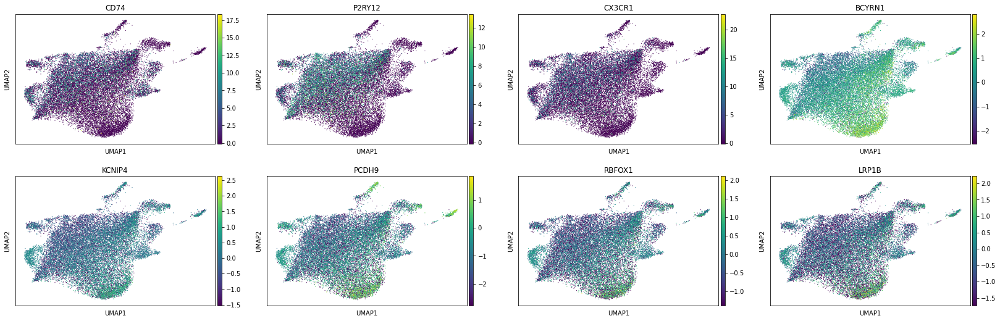

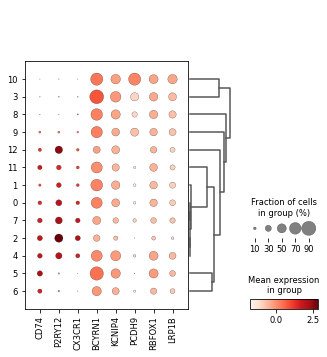

In [11]:
#CLUSTER 3 - P2RY12neg_BCYRN1hi

genes = ['CD74','P2RY12', 'CX3CR1', 'BCYRN1', 'KCNIP4', 'PCDH9', 'RBFOX1', 'LRP1B']

sc.pl.umap(mudata['rna'], color = genes)
sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

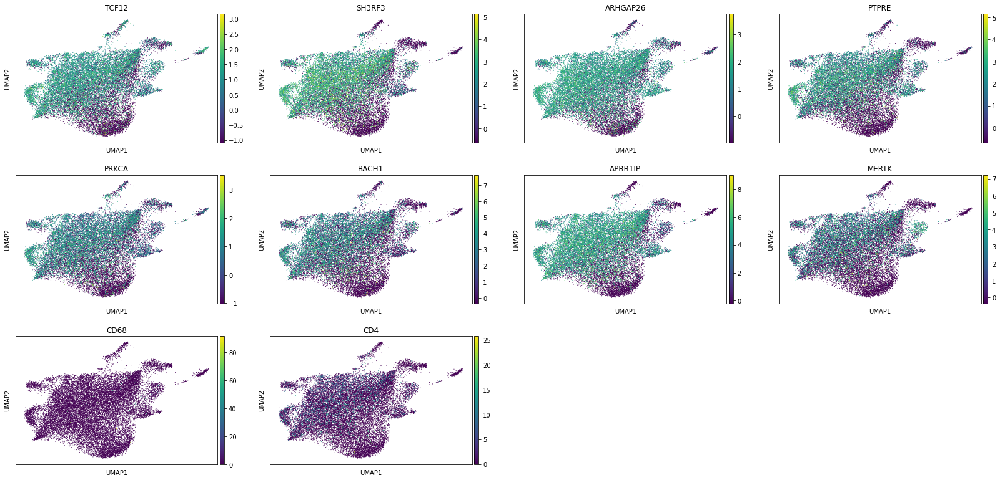

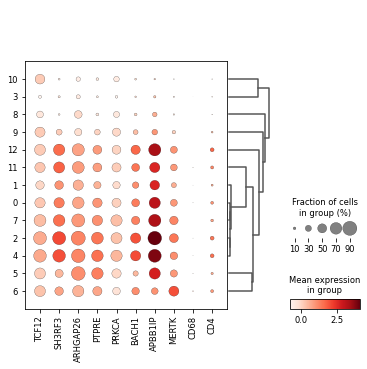

In [12]:
#CLUSTER 4 - Microglia - P2RY12pos_APBB1IPhi_RUNX1med

genes = ['TCF12', 'SH3RF3', 'ARHGAP26', 'PTPRE', 'PRKCA', 'BACH1', 'APBB1IP', 'MERTK', 'CD68', 'CD4']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

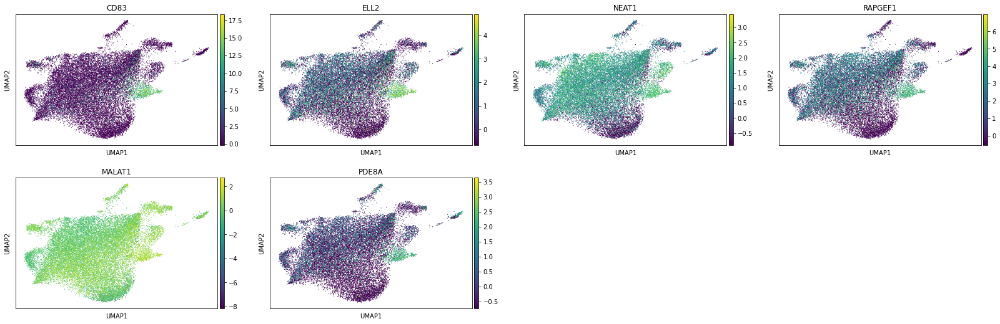

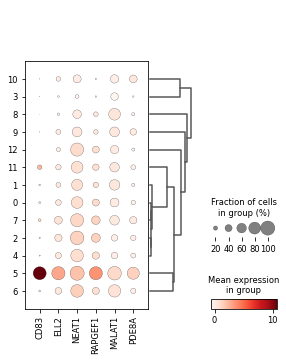

In [13]:
#CLUSTER 5 - DendriticCells_CD83hi_ELL2

genes = ['CD83', 'ELL2', 'NEAT1', 'RAPGEF1', 'MALAT1', 'PDE8A']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

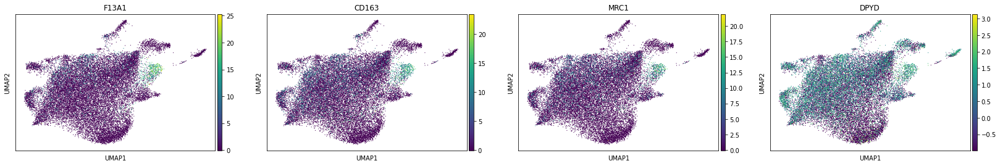

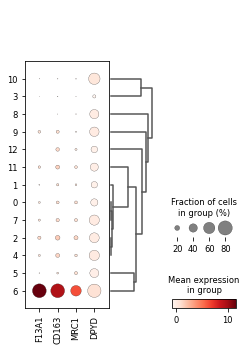

In [14]:
#CLUSTER 6 - M2 macrophages - F13A1pos_CD163pos_MRC1pos

genes = ['F13A1', 'CD163', 'MRC1', 'DPYD']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

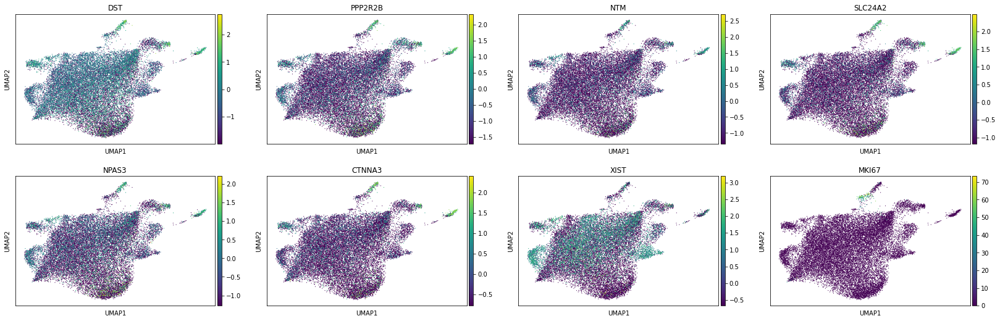

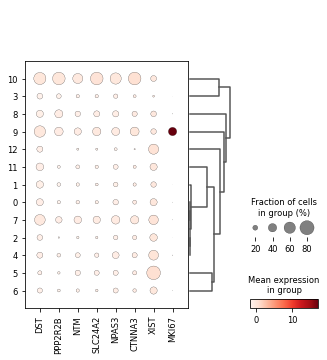

In [15]:
#CLUSTER 7 - P2RY12pos_MKI67

genes = [ 'DST', 'PPP2R2B', 'NTM', 'SLC24A2', 'NPAS3', 'CTNNA3', 'XIST', 'MKI67']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

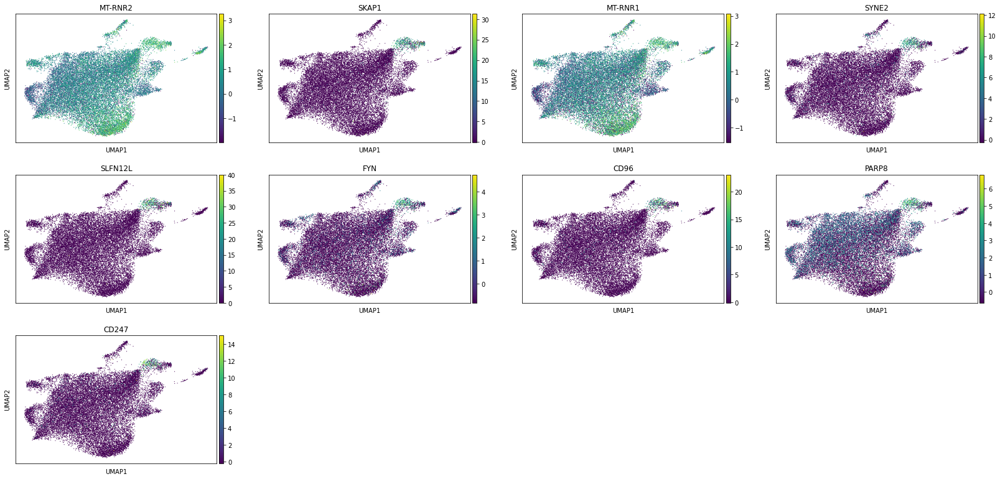

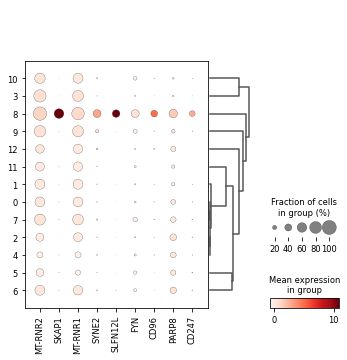

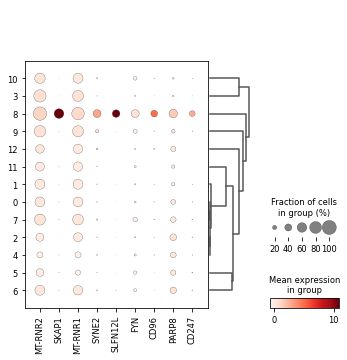

In [16]:
#CLUSTER 8 - Tcell_CD96pos_CD247pos

genes = ['MT-RNR2', 'SKAP1', 'MT-RNR1', 'SYNE2', 'SLFN12L', 'FYN', 'CD96', 'PARP8', 'CD247']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

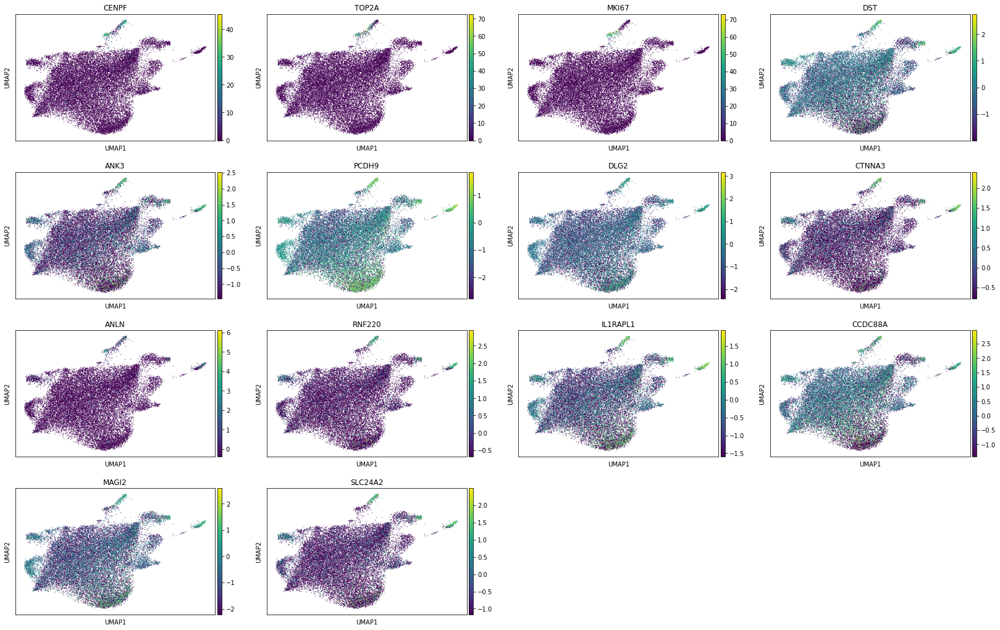

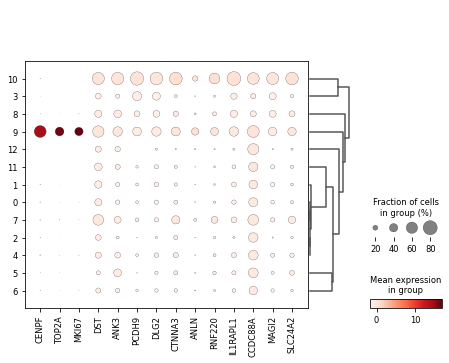

In [17]:
#CLUSTER 9 - Proliferating microglia - CENPFpos_TOP2Apos_MKI67pos

genes = ['CENPF',
'TOP2A',
'MKI67',
'DST',
'ANK3',
'PCDH9',
'DLG2',
'CTNNA3',
'ANLN',
'RNF220',
'IL1RAPL1',
'CCDC88A',
'MAGI2',
'SLC24A2'
]

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

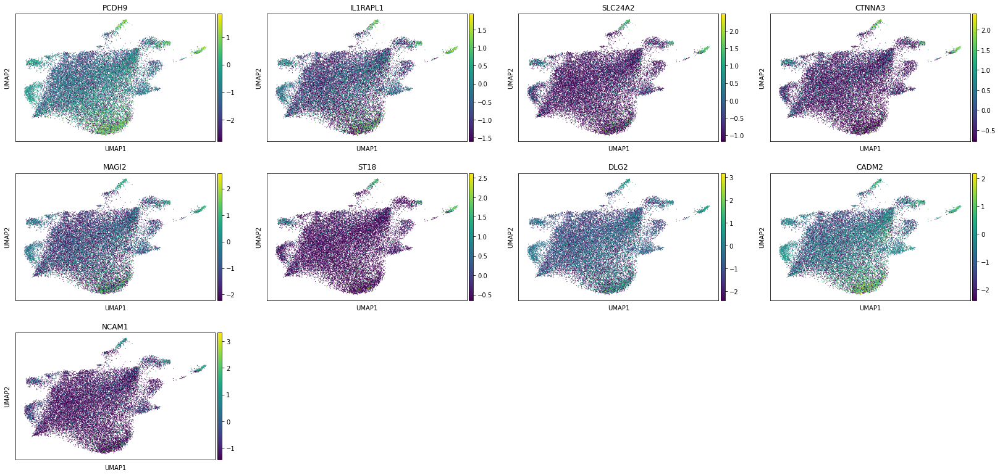

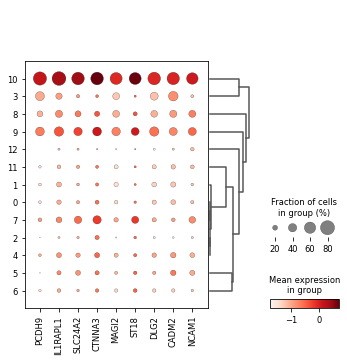

In [18]:
#CLUSTER 10 - High myelin - SLC24A2hi_CTNNA3hi

genes = [ 'PCDH9', 'IL1RAPL1', 'SLC24A2', 'CTNNA3', 'MAGI2', 'ST18', 'DLG2', 'CADM2', 'NCAM1']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

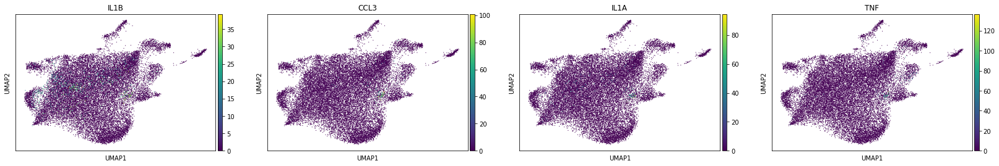

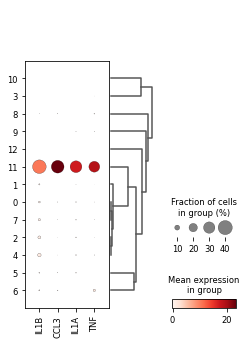

In [19]:
#CLUSTER 11 - Expresses SPP1 associated with perivascular cells https://www.nature.com/articles/s41593-023-01257-z - P2RY12pos_IL1Bpos_CCL3pos_IL1Apos

genes = ['IL1B', 'CCL3', 'IL1A', 'TNF']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

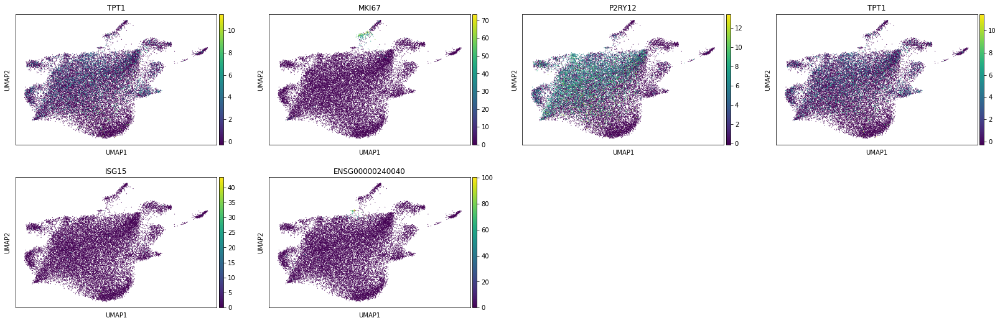

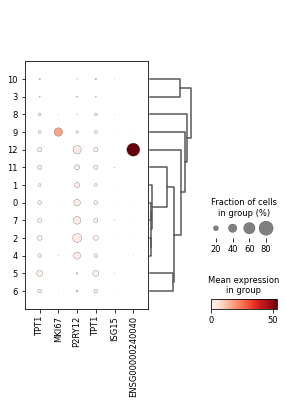

In [20]:
#CLUSTER 12 - P2RY12pos_ENSG00000240040pos

genes = ['TPT1', 'MKI67', 'P2RY12', 'TPT1', 'ISG15', 'ENSG00000240040']

sc.pl.umap(mudata['rna'], color = genes)

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

# 4.0 Transfer labels and final checks

In [6]:
mudata['rna'].obs['annotation_level_0'] = mudata['rna'].obs['mm_leiden_res0.5'].replace({'0' : 'Immune',
 '1' : 'Immune',
 '2' : 'Immune',
 '3' : 'Immune',
 '4' : 'Immune',
 '5' : 'Immune',
 '6' : 'Immune',
 '7' : 'Immune',
 '8' : 'Immune',
 '9' : 'Immune',
 '10' : 'Immune',
 '11' : 'Immune',
 '12' : 'Immune'
})

mudata['rna'].obs['annotation_level_1'] = mudata['rna'].obs['mm_leiden_res0.5'].replace({'0' : 'Microglia',
 '1' : 'Microglia',
 '2' : 'Microglia',
 '3' : 'Microglia',
 '4' : 'Microglia',
 '5' : 'Dendritic cells',
 '6' : 'M2 Macrophages',
 '7' : 'Microglia',
 '8' : 'Tcells',
 '9' : 'Microglia',
 '10' : 'Microglia',
 '11' : 'Microglia',
 '12' : 'Microglia'
})

mudata['rna'].obs['annotation_level_2'] = mudata['rna'].obs['mm_leiden_res0.5'].replace({'0' : 'Microglia_P2RY12pos_APBB1IPmed_1',
 '1' : 'Microglia_P2RY12pos_APBB1IPmed_2',
 '2' : 'Microglia_P2RY12pos_APBB1IPhi_RUNX1hi_ARHGAP24hi',
 '3' : 'Microglia_P2RY12neg_BCYRN1hi',
 '4' : 'Microglia_P2RY12pos_APBB1IPhi_RUNX1med',
 '5' : 'DendriticCells_CD83hi_ELL2',
 '6' : 'M2Macrophages_F13A1pos_CD163pos_MRC1pos',
 '7' : 'Microglia_P2RY12pos',
 '8' : 'Tcells_CD96pos_CD247pos',
 '9' : 'Microglia_CENPFpos_TOP2Apos_MKI67pos',
 '10' : 'Microglia_SLC24A2hi_CTNNA3hi',
 '11' : 'Microglia_P2RY12pos_IL1Bpos_CCL3pos_IL1Apos',
 '12' : 'Microglia_P2RY12pos_ENSG00000240040pos'
})

In [22]:
mudata['rna'].obs[['annotation_level_0','annotation_level_1','annotation_level_2']].to_csv('../../all_subclustered_annotations/microglia_annotations.csv')

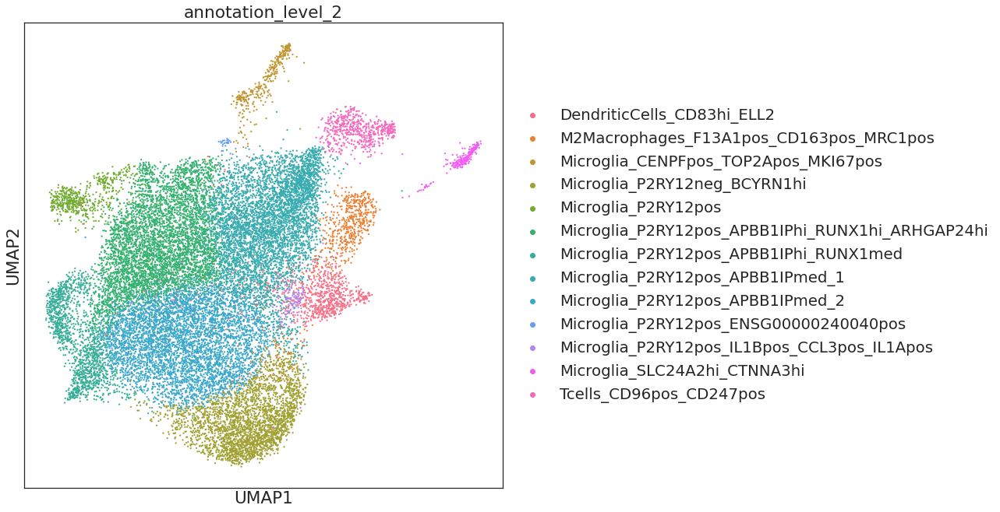

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc={'figure.figsize':(11,11)}, font_scale=1.8)
sns.set_style('white')

sc.pl.umap(mudata['rna'], color='annotation_level_2', s=20, palette=sns.color_palette("husl", len(mudata['rna'].obs['annotation_level_2'].unique())), show=False)
plt.savefig('Microglia_annotation_level_2_UMAP.png', dpi=300, bbox_inches )
plt.show()

<AxesSubplot:title={'center':'annotation_level_2'}, xlabel='UMAP1', ylabel='UMAP2'>

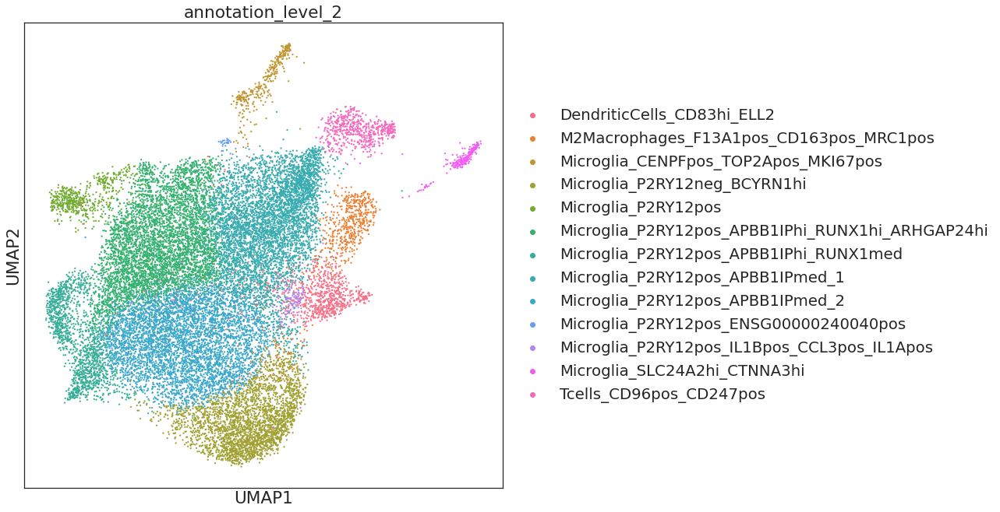

In [24]:
sc.pl.umap(mudata['rna'], color = 'annotation_level_2', s = 20, palette=sns.color_palette("husl", len(mudata['rna'].obs['annotation_level_2'].unique())), show=False)


In [ ]:
genes = ['PTPRC','FTL','LRRK2','SNCA']

sc.pl.dotplot(mudata['rna'], genes, groupby='mm_leiden_res0.5', dendrogram = True)

In [7]:
gene_ids = mudata['rna'].var.index.values
clusters = mudata['rna'].obs['annotation_level_2'].astype('category').cat.categories
obs = mudata['rna'].layers['raw_counts'].toarray()
obs = pd.DataFrame(obs,columns=gene_ids,index=mudata['rna'].obs['annotation_level_2'])
average_obs = obs.groupby(level=0).mean()
obs_bool = obs.astype(bool)
fraction_obs = obs_bool.groupby(level=0).sum()/obs_bool.groupby(level=0).count()
average_obs.T.to_csv("average.csv")
fraction_obs.T.to_csv("fraction.csv")

pd.concat([average_obs['SNCA'].rename('SNCA_average'), fraction_obs['SNCA'].rename('SNCA_fraction')], axis = 1).to_csv('SNCA_averageexpression_fractionofcells.csv')
pd.concat([average_obs['TARDBP'].rename('TDP43_average'), fraction_obs['SNCA'].rename('TDP43_fraction')], axis = 1).to_csv('averageexpression_fractionofcells.csv')

In [15]:
pd.concat([average_obs['SNCA'].rename('SNCA_average'), fraction_obs['SNCA'].rename('SNCA_fraction')], axis = 1).to_csv('microglia_SNCA_averageexpression_fractionofcells.csv')

In [14]:
pd.concat([average_obs['TARDBP'].rename('TDP43_average'), fraction_obs['SNCA'].rename('TDP43_fraction')], axis = 1).to_csv('TDP43_averageexpression_fractionofcells.csv')

In [16]:
pd.concat([average_obs['TARDBP'].rename('TDP43_average'), fraction_obs['SNCA'].rename('TDP43_fraction')], axis = 1)

,TDP43_average,TDP43_fraction
annotation_level_2,,
DendriticCells_CD83hi_ELL2,0.054022,0.232893
M2Macrophages_F13A1pos_CD163pos_MRC1pos,0.108280,0.221338
Microglia_CENPFpos_TOP2Apos_MKI67pos,0.132768,0.177966
Microglia_P2RY12neg_BCYRN1hi,0.012951,0.051803
Microglia_P2RY12pos,0.095638,0.273490
Microglia_P2RY12pos_APBB1IPhi_RUNX1hi_ARHGAP24hi,0.107494,0.294555
Microglia_P2RY12pos_APBB1IPhi_RUNX1med,0.074694,0.225370
Microglia_P2RY12pos_APBB1IPmed_1,0.071605,0.186631
Microglia_P2RY12pos_APBB1IPmed_2,0.047119,0.128687
